In [1]:
# Install YOLOv8 and dependencies
!pip install ultralytics
!pip install opencv-python-headless
!pip install roboflow


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.8/871.8 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.8
    Uninstalling idna-3.8:
      Successfully uninstalled idna-3.8


In [2]:
!curl -L "https://app.roboflow.com/ds/M9o2PFk5Ae?key=l92hN7FFAc" -o roboflow.zip
!unzip -o roboflow.zip
!rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   903  100   903    0     0   2350      0 --:--:-- --:--:-- --:--:--  2351
100 63.1M  100 63.1M    0     0  33.2M      0  0:00:01  0:00:01 --:--:-- 66.8M
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/111binder_Page_017_jpg.rf.592f04d8a47fe6f39211c4fab4324ee6.jpg  
 extracting: test/images/111binder_Page_020_jpg.rf.980f5ce2a7aa49aced7f1f6a1bad3b66.jpg  
 extracting: test/images/111binder_Page_021_jpg.rf.fc0892f56b5f03c8da0202f143f42815.jpg  
 extracting: test/images/111binder_Page_027_jpg.rf.1121ea1e732ab3a353ea0bb09505b03f.jpg  
 extracting: test/images/111binder_Page_033_jpg.rf.ce039fb7a68f3cc0026fb10a5b563f50.jpg  
 extracting: test/images/111binder_Page_034_jpg.rf.2

In [3]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.pt')  # Use yolov8n (Nano), you can replace it with yolov8s, yolov8m, etc.

# Train the model on your dataset
model.train(data='/content/data.yaml', epochs=30, imgsz=640)

# Evaluate the model
metrics = model.val()




100%|██████████| 6.25M/6.25M [00:00<00:00, 121MB/s]


Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

100%|██████████| 755k/755k [00:00<00:00, 21.5MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/train/labels... 349 images, 0 backgrounds, 0 corrupt: 100%|██████████| 349/349 [00:00<00:00, 1916.89it/s]

train: New cache created: /content/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/valid/labels... 98 images, 0 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<00:00, 1654.50it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.36G        1.1      2.997      1.342        202        640: 100%|██████████| 22/22 [00:13<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.05s/it]

                   all         98        593      0.466      0.195        0.2      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.19G     0.6666      1.737      1.047        139        640: 100%|██████████| 22/22 [00:05<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.99it/s]

                   all         98        593      0.619      0.595      0.597      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.21G     0.6303      1.281      1.008        162        640: 100%|██████████| 22/22 [00:07<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all         98        593      0.587      0.671      0.704      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.21G     0.6013      1.213      1.005        147        640: 100%|██████████| 22/22 [00:05<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all         98        593      0.574      0.636      0.654      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.19G     0.5807      1.118     0.9783        150        640: 100%|██████████| 22/22 [00:08<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]

                   all         98        593      0.674       0.75      0.737      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.19G     0.5625      1.054     0.9738        172        640: 100%|██████████| 22/22 [00:06<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all         98        593      0.668      0.802      0.807      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.2G     0.5535      1.025     0.9692        160        640: 100%|██████████| 22/22 [00:05<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all         98        593      0.711      0.723      0.772      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.23G     0.5492      1.015     0.9645        162        640: 100%|██████████| 22/22 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all         98        593       0.67      0.758      0.761       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.2G     0.5277     0.9259     0.9493        141        640: 100%|██████████| 22/22 [00:05<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]

                   all         98        593       0.71      0.724      0.731      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.23G     0.5209     0.9273     0.9569        129        640: 100%|██████████| 22/22 [00:06<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all         98        593       0.65       0.78      0.801      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.24G     0.5121     0.8851     0.9488        148        640: 100%|██████████| 22/22 [00:05<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.90it/s]

                   all         98        593      0.723      0.774      0.799      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.19G     0.4978     0.8826     0.9465        154        640: 100%|██████████| 22/22 [00:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.57it/s]

                   all         98        593      0.733      0.792      0.828      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       2.2G     0.4873     0.8645     0.9388        158        640: 100%|██████████| 22/22 [00:05<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.62it/s]

                   all         98        593      0.722      0.784      0.797       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.19G     0.4859     0.8332     0.9314        129        640: 100%|██████████| 22/22 [00:07<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all         98        593      0.748      0.779      0.812      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.23G     0.4818     0.8325     0.9353        107        640: 100%|██████████| 22/22 [00:05<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.88it/s]

                   all         98        593      0.778      0.748      0.794      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.18G     0.4761     0.8053     0.9371        118        640: 100%|██████████| 22/22 [00:06<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all         98        593      0.676      0.827      0.799      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.2G     0.4648     0.7864     0.9195        140        640: 100%|██████████| 22/22 [00:05<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all         98        593      0.758       0.83      0.844      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.18G     0.4611      0.788     0.9231        145        640: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all         98        593      0.754      0.804       0.83      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       2.2G     0.4492     0.7856     0.9185        167        640: 100%|██████████| 22/22 [00:05<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]

                   all         98        593      0.749      0.844      0.856      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.19G     0.4552     0.7696     0.9252        118        640: 100%|██████████| 22/22 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.63it/s]

                   all         98        593      0.753      0.802      0.833      0.749


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.24G     0.4338     0.8197     0.9263         75        640: 100%|██████████| 22/22 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all         98        593       0.75      0.782      0.821       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.18G     0.4159     0.7661     0.8959         74        640: 100%|██████████| 22/22 [00:06<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all         98        593      0.792      0.834       0.86      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.18G     0.4094     0.7303     0.8923         86        640: 100%|██████████| 22/22 [00:05<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all         98        593      0.753      0.829      0.855      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.19G     0.3952     0.7056     0.8916         66        640: 100%|██████████| 22/22 [00:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]

                   all         98        593      0.751      0.821      0.853      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.18G     0.3897     0.6762     0.8848         85        640: 100%|██████████| 22/22 [00:05<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]

                   all         98        593        0.8       0.82      0.865      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.18G     0.3915     0.6838     0.8933         79        640: 100%|██████████| 22/22 [00:07<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]

                   all         98        593      0.794      0.822      0.868      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.18G     0.3836     0.6543     0.8788         69        640: 100%|██████████| 22/22 [00:05<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all         98        593      0.798      0.782      0.855      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.18G     0.3784     0.6458     0.8776        102        640: 100%|██████████| 22/22 [00:07<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all         98        593      0.816      0.783       0.85      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.19G     0.3789     0.6245     0.8719         82        640: 100%|██████████| 22/22 [00:04<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]

                   all         98        593      0.813      0.801      0.861      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.18G     0.3767     0.6357     0.8752         71        640: 100%|██████████| 22/22 [00:07<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]

                   all         98        593      0.778       0.82      0.862      0.766



30 epochs completed in 0.077 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.18s/it]


                   all         98        593      0.753      0.829      0.855      0.771
         advertisement         35         68      0.728      0.853      0.855      0.765
                  news         86        442      0.763      0.875      0.865      0.799
                notice         17         83      0.769      0.759      0.845       0.75
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to runs/detect/train
Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/valid/labels.cache... 98 images, 0 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.01s/it]


                   all         98        593      0.753      0.829      0.855      0.774
         advertisement         35         68      0.728      0.853      0.855      0.767
                  news         86        442      0.763      0.876      0.865      0.801
                notice         17         83      0.769      0.759      0.845      0.754
Speed: 1.1ms preprocess, 7.1ms inference, 0.0ms loss, 14.8ms postprocess per image
Results saved to runs/detect/train2



image 1/1 /content/IMG_20240904_171353626.jpg: 640x416 1 advertisement, 12 newss, 296.1ms
Speed: 15.0ms preprocess, 296.1ms inference, 26.3ms postprocess per image at shape (1, 3, 640, 416)


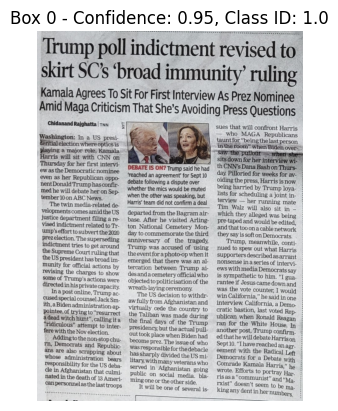

Saved cropped box 0 with confidence 0.95 and class ID 1.0.


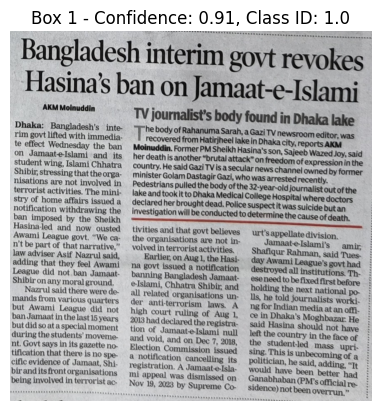

Saved cropped box 1 with confidence 0.91 and class ID 1.0.


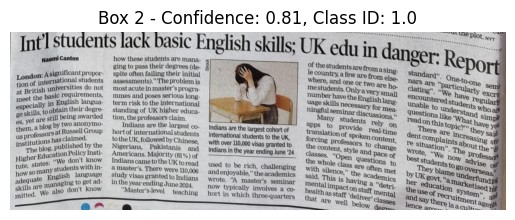

Saved cropped box 2 with confidence 0.81 and class ID 1.0.


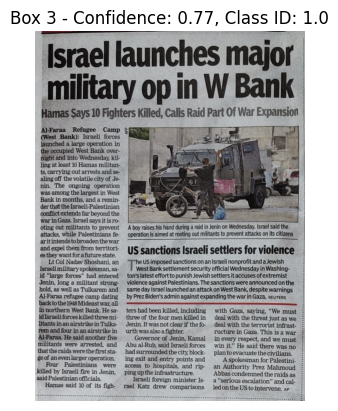

Saved cropped box 3 with confidence 0.77 and class ID 1.0.


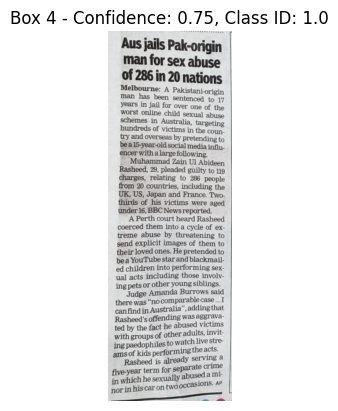

Saved cropped box 4 with confidence 0.75 and class ID 1.0.


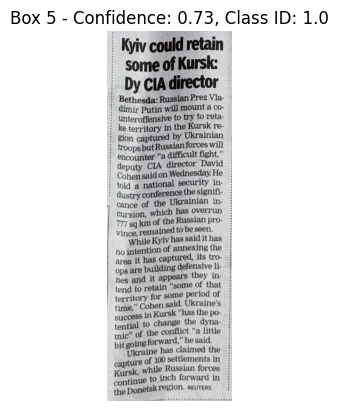

Saved cropped box 5 with confidence 0.73 and class ID 1.0.


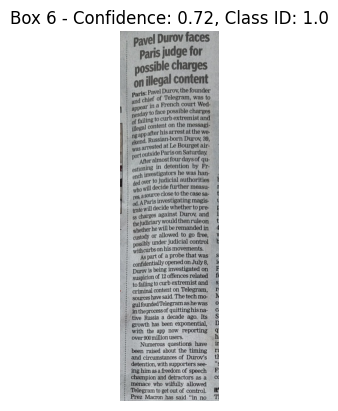

Saved cropped box 6 with confidence 0.72 and class ID 1.0.


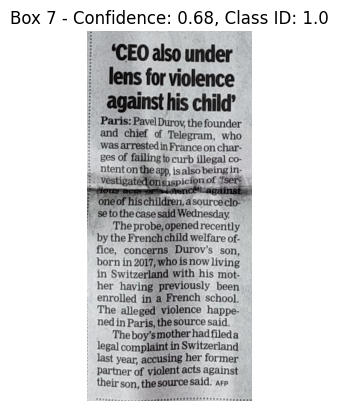

Saved cropped box 7 with confidence 0.68 and class ID 1.0.


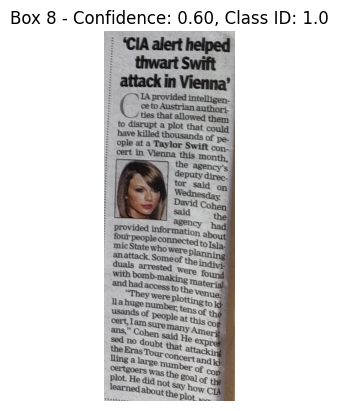

Saved cropped box 8 with confidence 0.60 and class ID 1.0.


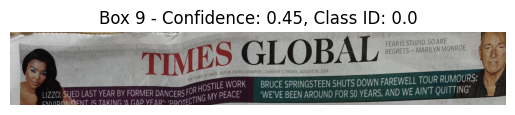

Saved cropped box 9 with confidence 0.45 and class ID 0.0.


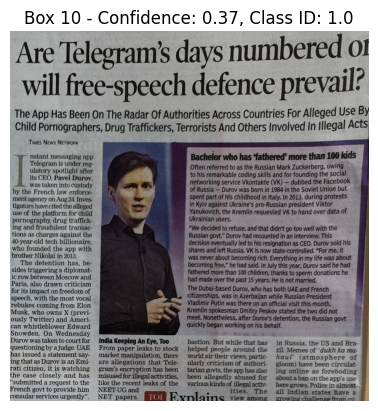

Saved cropped box 10 with confidence 0.37 and class ID 1.0.


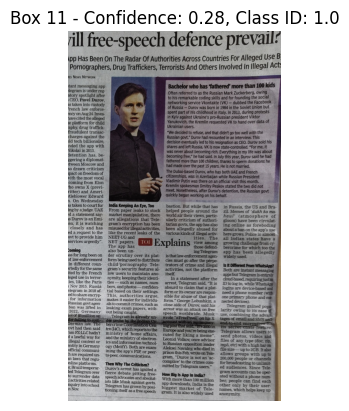

Saved cropped box 11 with confidence 0.28 and class ID 1.0.


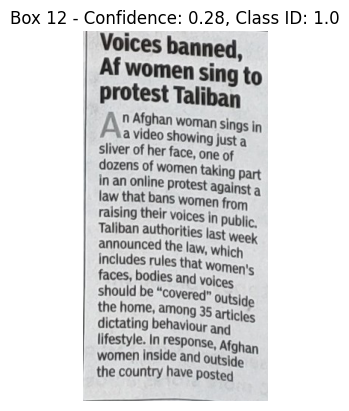

Saved cropped box 12 with confidence 0.28 and class ID 1.0.


In [2]:
from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt

# Load the model
model = YOLO('/content/best_30_epochs.pt')

# Create a directory to save cropped images
output_dir = "cropped_boxes3"
os.makedirs(output_dir, exist_ok=True)

# Perform inference on an image
results = model('/content/IMG_20240904_171353626.jpg')

# Get the original image for cropping
original_image = cv2.imread('/content/IMG_20240904_171353626.jpg')

# Loop over the detected objects
for i, box in enumerate(results[0].boxes.xyxy):
    x1, y1, x2, y2 = map(int, box)
    confidence = results[0].boxes.conf[i]  # Get confidence score
    class_id = results[0].boxes.cls[i]  # Get class ID

    if confidence > 0.1:  # Threshold for confidence
        # Crop the image using the bounding box coordinates
        cropped_img = original_image[y1:y2, x1:x2]

        # Save the cropped image
        output_path = os.path.join(output_dir, f"box_{i}.jpg")
        cv2.imwrite(output_path, cropped_img)

        # Display the cropped image using matplotlib
        plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Hide axes
        plt.title(f"Box {i} - Confidence: {confidence:.2f}, Class ID: {class_id}")
        plt.show()

        print(f"Saved cropped box {i} with confidence {confidence:.2f} and class ID {class_id}.")


In [3]:
!apt-get install tesseract-ocr
!pip install pytesseract


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,899 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123597 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-


image 1/1 /content/IMG_20240904_171353626.jpg: 640x416 1 advertisement, 12 newss, 144.2ms
Speed: 3.4ms preprocess, 144.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 416)


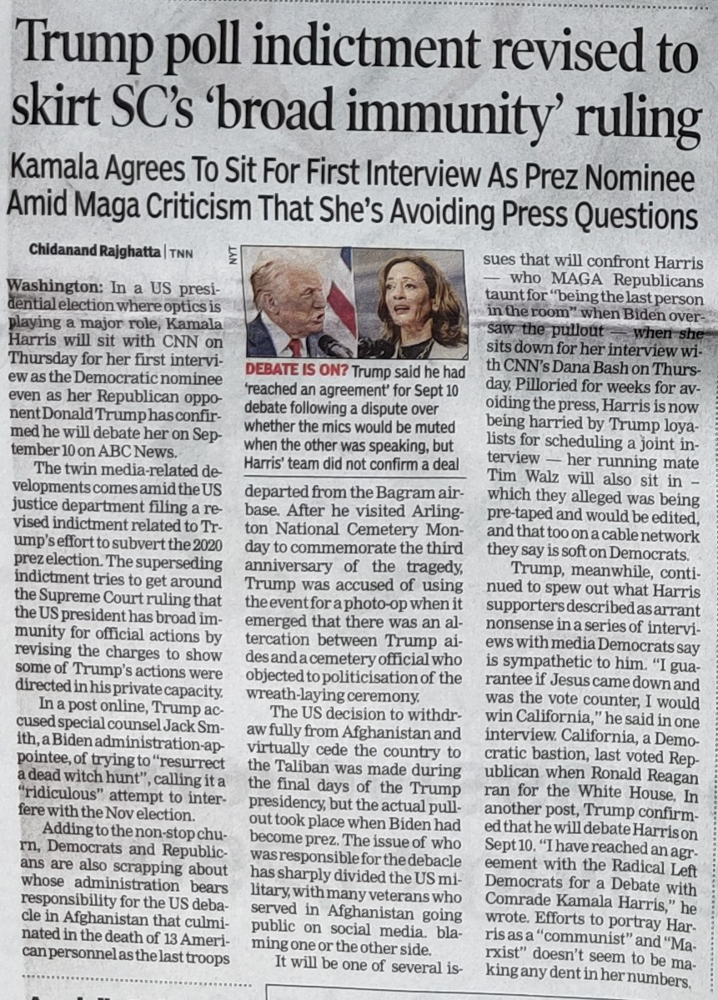

Text from box 0:
Trump poll indi
ctment revised to.
skirt SC’s ‘broad immunity’ ruling
Kamala Agrees To Sit For First Interview As Prez Nominee
Amid Maga Criticism That She’s Avoiding Press Questions
Chidanand Rajghatta | tw
fashington In a US presi-
election where optics is
playing a major role, Kamala
will sit with CNN on
Thursday for her first intervi-
ew as the Democratic nominee
even as her Republican oppo-
nentDonald Trump hasconfir-
med he will debate her on Sep-
tember 10 on ABC News.
The twin media-related de-
velopmentscomesamid the US
Justice department filing a re-
vised indictment related to Tr-
ump'seffort to subvert the 2020
prezelection. The superseding
indictment tries to get around
the Supreme Court ruling that
the US president has broad im-
munity for official actions by
revising the charges to show
some of Trump's actions were
directed in his private capacity.
Ina post online, Trump ac-
cused special counsel Jack Sm-
ith,aBiden administration-ap-
pointee, of trying 

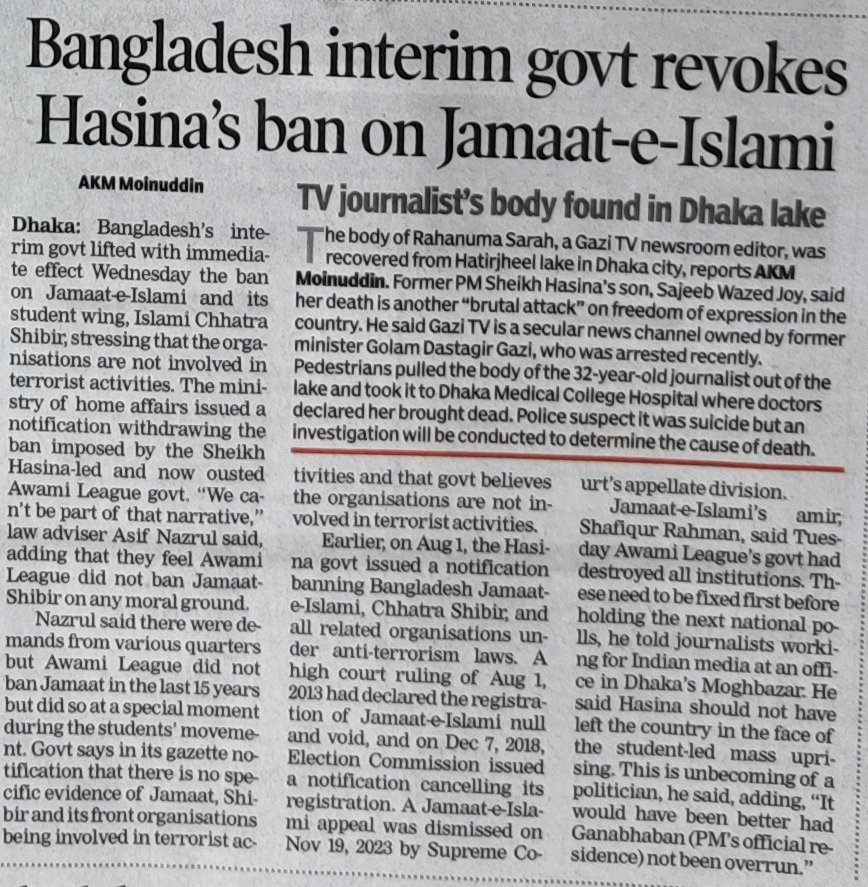

Text from box 1:
Bangladesh interim govt revokes
Hasina’s ban on Jamaat-e-Islami
AKM Moinuddin
Dhaka Bangladesh's inte-
rim govt lifted with immedia-
te effect Wednesday the ban
on Jamaat-Islami and its
student wing, Islami Chhatra
Shibir, stressing that the orga-
nisations are not involved in
terrorist activities. The mini-
stry of home affairs issued a
notification withdrawing the
ban imposed by the Sheikh
Hasina-led and now ousted
Awami League govt, “We ca-
n't be part of that narrative,”
law adviser Asif Nazrul said,
adding that they feel Awami
League did not ban Jamaat-
Shibir on any moral ground,
Nazrul said there were de-
mands from various quarters
but Awami League did not
ban Jamaat in the last 15 years
but did so at a special moment
during the students’ moveme-
nt. Govt says in its gazette no-
tification that there is no spe-
cific evidence of Jamaat, Shi-
birand its front organisations
being involved in terrorist ac-
TV journalist’s body found in Dhaka lake
"The body of Raha

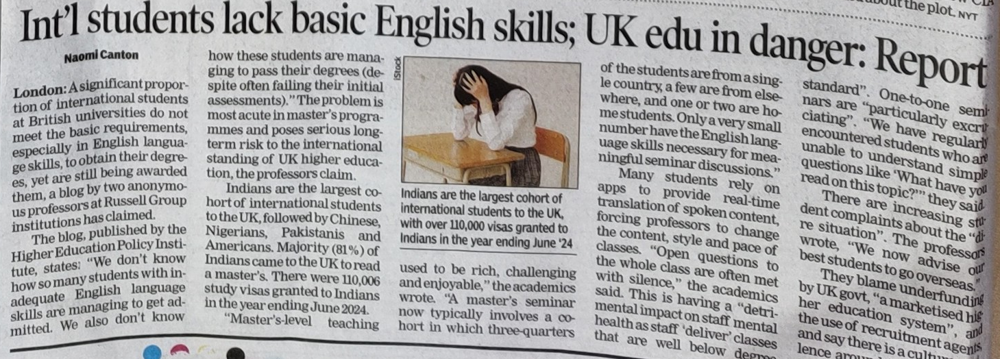

Text from box 2:
Int’! student
ificant propor-
Pemtonal students
universities do not
ic requirements,
English ensuss
espec! tain their degre-
ge skills, oo ing awarded
ya blog by two anonymo-
Saas orsat Russell Group
usp)
London
tion of int
at British
meet the Das
meblished by oe
cy Insti-
i education Policy
eager “We don't aoe
ia a students vit 
yw si ave
pdequate ae a ey
sified. We ‘also don't know
mitted.
how these sents are meek
ing to pass the! legrees (de-
Scie often failing their initial
assessments).” The problem is
most acute in master’s progra-
mumes and poses serious long-
term risk to the international
standing of UK higher educa-
tion, the professors claim.
Indians are the largest co-
hortof international students
tothe UK, followed by Chinese,
Nigerians, Pakistanis and
Americans. Majority (81%) of
Indians came tothe UK to read
€ master’s, There were 110,006
study visas granted to Indians
in the year ending June 2024,
“Master’s-level teaching
s lack basic English skills;
e

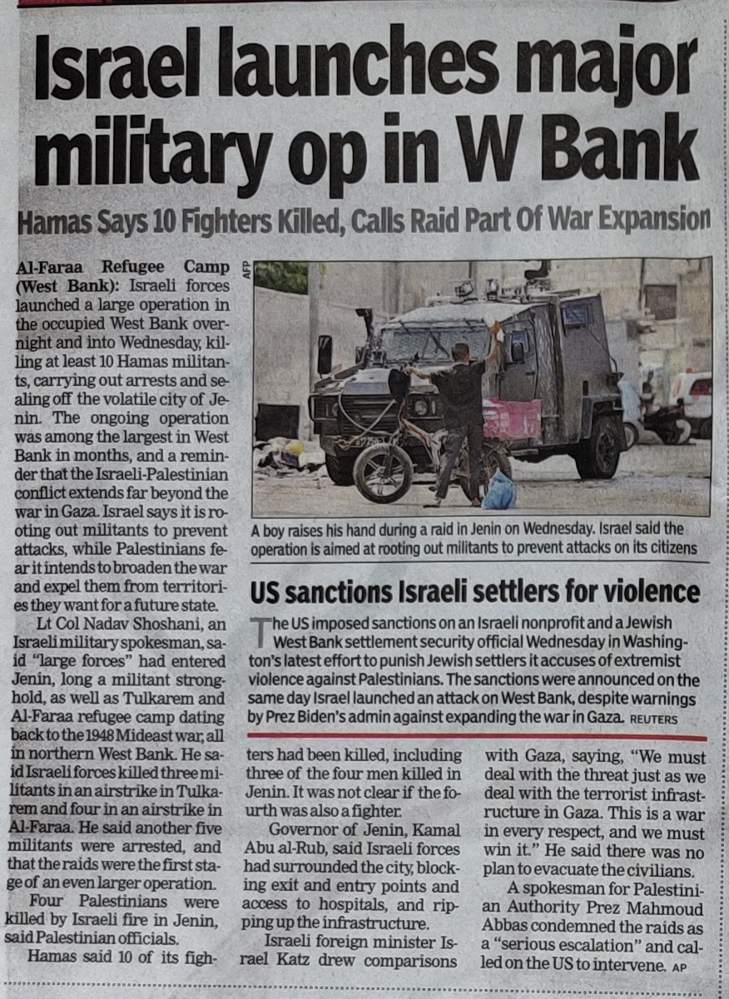

Text from box 3:
Israel launches major
Military op in W Bank
Hamas Says 10 Fi pen Killed, Calls Raid Part Of War Expansion
Al-Faraa Refugee Camp
(West Bank) Israeli forces
launched a large operation in
the occupied West Bank over-
night and into Wednesday, kil-
ling at least 10 Hamas militan-
ts, carrying out arrests and se-
aling off the volatile city of Je
nin. The ongoing operation
was among the largest in West
Bank in months, and a remin-
der that the Israeli-Palestinian
conflict extends far beyond the
war in Gaza. Israel says it is ro-
oting out militants to prevent
attacks, while Palestinians fe-
aritintendstobroaden the war
and expel them from territori-
es they want for afuture state.
Lt Col Nadav Shoshani, an
Israeli military spokesman, sa-
id “large forces” had entered
Jenin, long a militant strong-
hold, as well as Tulkarem and
Al-Faraa refugee camp dating
back to the 1948 Mideast war, all
in northern West Bank. He sa-
id Israeli forces killed three mi-
litants in an airstri

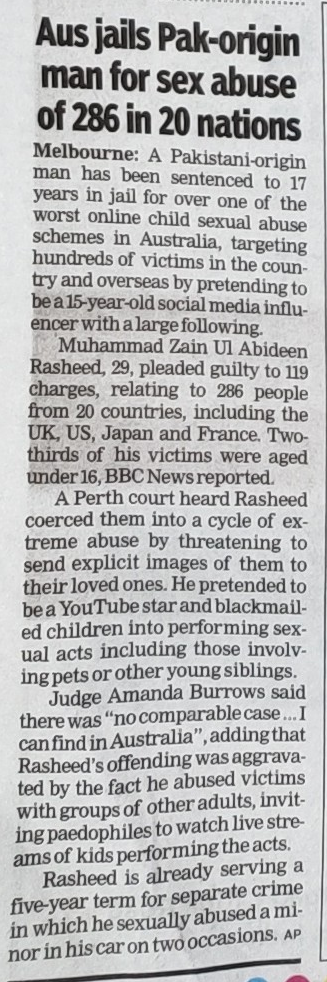

Text from box 4:
Aus jails Pak-origin
man for sex abuse
of 286 in 20 nations
Melbourne A Pakistani-origi
man has been sentenced {0°17
years in jail for over one of the
worst online child sexual abuse
schemes in Australia, targeting
hundreds of victims in the coun-
try and overseas by pretending to
beal5-year-old social media influ-
encer with a large following.
Muhammad Zain Ul Abideen
Rasheed, 29, pleaded guilty to 19
charges, relating to 286 people
from 20 countries, including the
UK, US, Japan and France. Two-
thirds of his victims were aged
under 16, BBC News reported.
A Perth court heard Rasheed
coerced them into a cycle of ex-
treme abuse by threatening to
send explicit images of them to
their loved ones. He pretended to
bea YouTube star and blackmail-
ed children into performing sex-
ual acts including those involy-
ing pets or other young siblings.
Judge Amanda Burrows said
there was “no comparable case....I
canfindin. Australia”, adding that
Rasheed’s offending was aggrava-
te

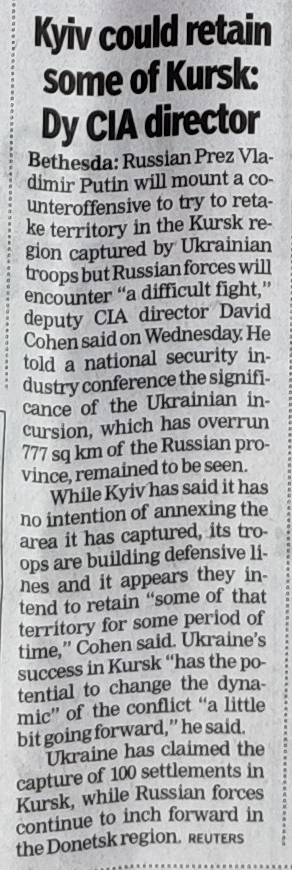

Text from box 5:
Kyiv could retain
some of Kursk
Dy CIA director
Bethesda Russian Prez Vla-
dimir Putin will mount a co-
Unteroffensive to try to reta-
ke territory in the Kursk re-
gion captured by Ukrainian
troops but Russian forces will
encounter “a difficult fight,”
 deputy CIA director David
 Cohensaidon Wednesday. He
 told a national security in-
dustry conference the signifi-
cance of the Ukrainian in-
cursion, which has overrun
77 sq km of the Russian pro-
vince, remained pee seen.
while Kyiv has said it has
no intention of annexing the
area it has captured, its tro-
opalaae building defensive li-
nes and it appears they in-
tend to retain “some of that
tial to change the dyna-
mic” of the conflict “a little
bit going forward,” he said,
e has claimed the
capture of 100 settlements in
Kursk, while Russian forces
ue to inch forward in
contin ‘
theDonetskregion. reuters



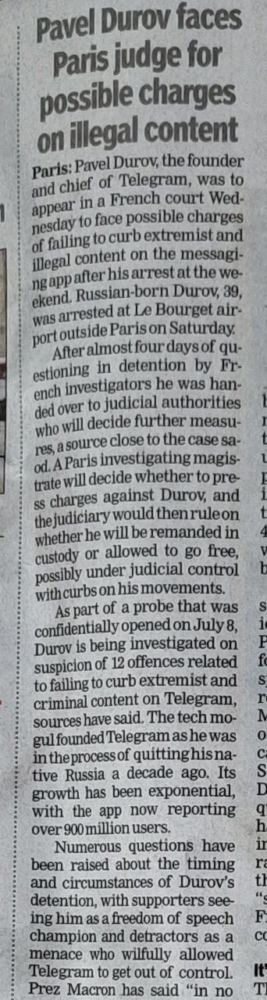

Text from box 6:
. pavel Durov faces
paris judge for
ible charges
on illegal content
"| ; Pavel Durov, the founder
r and chief of Telegram, was to
pear ina French court Wed-
i aeeday to face possible charges
i af failing to curb extremist and
| logal content on the messagi-
| ngappafter his arrest at the we-
+ trend. Russian-born Duroy, 39,
' arrested at Le Bourget air-
i yort outside Paris on Saturday.
ne ‘After almost four days of qu-
j ning in detention by Fr-
} ench investigators he was han-
i ded over to judicial authorities
who will decide further measu-
yes asource close to the case sa-
od, A Paris investigating magis-
trate will decide whether to pre-
i gg charges against Duroy, and
} thejudiciary wouldthenruleon,
whether he will be remanded in
? oystody or allowed to go free,
P jbly under judicial control
 withcurbs on his movements.
i As part of a probe that was
? confidentially opened on July 8,
? Durov is being investigated on
£ suspicion of 12 offences related
2 to failing

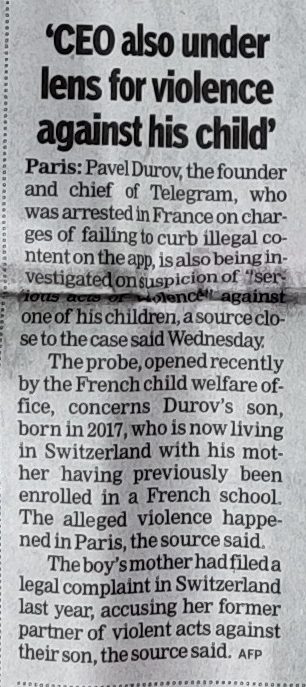

Text from box 7:
‘CEO also under
lens for violence
against his child’
Paris PavelDurov, the founder
and chief of Telegram, who
was arrested in France on char-
ges of failing to curb illegal
se to the case said Wednesday,
The probe, opened recently
by the Freneh child welfare of-
fice, concerns Durov’s son,
born in 2017, who is now living
in Switzerland with his mot-
her having previously been
enrolled in a French school.
The alleged violence happe-
ned in Paris, thesource said.
The boy’smother had fileda
legal complaint in Switzerland
last year, accusing her former
partner of violent acts against
their son, thesource said. arp



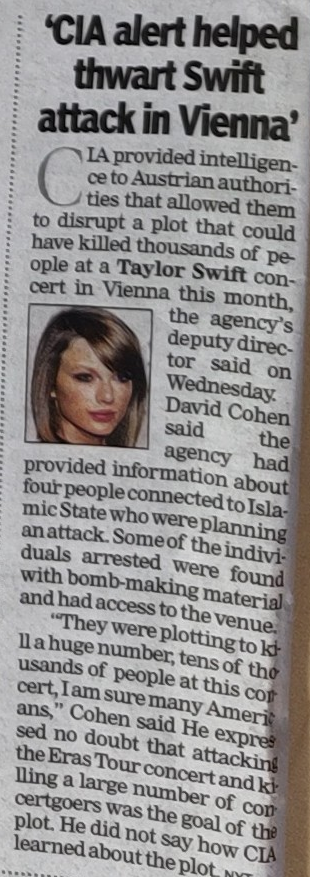

Text from box 8:




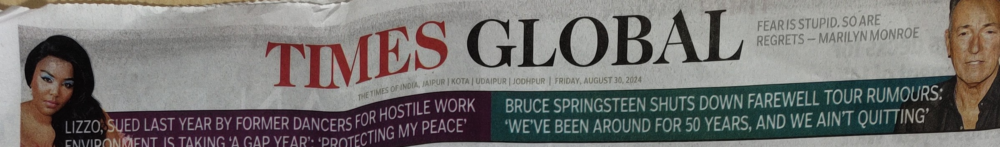

Text from box 9:
<a HOS om re Sue eT EMM z a tame
perl Acasa Sil ANCHO A MU



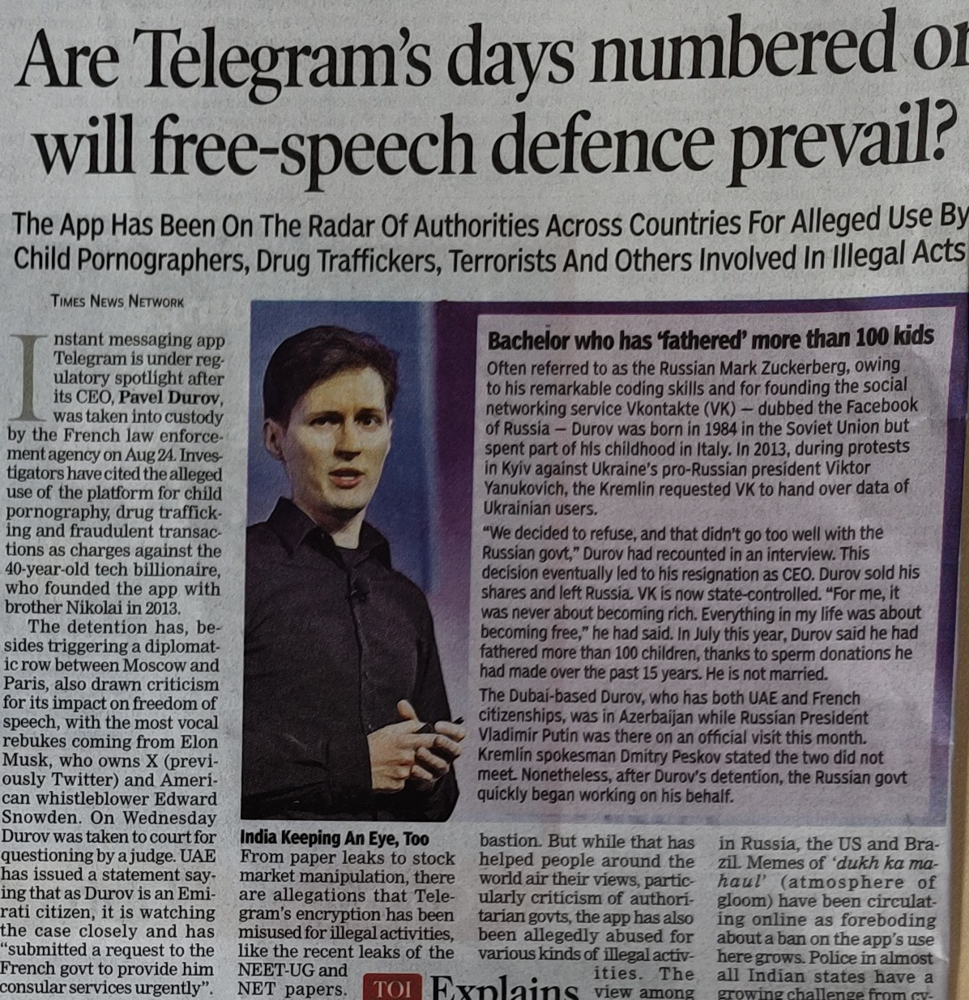

Text from box 10:
Are Telegram’s days numbered o!
will free-speech defence prevail?
The App Has Been On The Radar Of Authorities Across Countries For Alleged Use By
Child Pornographers, Drug Traffickers, Terrorists And Others Involved In Illegal Acts
Times News Network
nstant messaging app
Telegram is under reg-
ulatory spotlight after
its CEO, Pavel Durov,
was taken into custody
by the French law enforce-
ment agency on Aug 24. Inves-
tigators have cited the alleged
use of the platform for child
pornography, drug traffick-
ing and fraudulent transae-
tions as charges against the
40-year-old tech billionaire,
who founded the app with
brother Nikolai in 2013.
The detention has, be-
sides triggering a diplomat-
ic row between Moscow and
Paris, also drawn criticism
for its impact on freedom of
speech, with the most vocal
rebukes coming from Elon
Musk, who owns X (previ-
ously Twitter) and Ameri-
can whistleblower Edward
Snowden. On Wednesday
Durov was taken to court for
questioning by a j

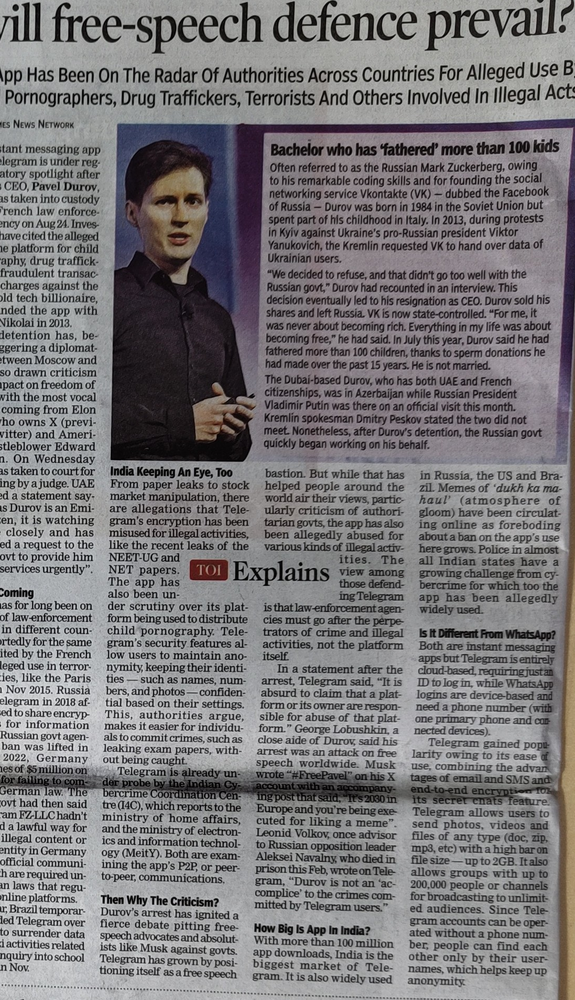

Text from box 11:
“ill free-speech defence prevall*
\pp Has Been On The Radar Of Authorities Across Countries For Alleged Use -
Pornographers, Drug Traffickers, Terrorists And Others Involved In Illegal A
ies News Network
Bachelor who has ‘fathered’ more than 100 kids
tant messaging app
legram is unider reg- Often referred to as the Russian Mark Zuckerberg, owing
atory spotlight after to his remarkable coding skills and for founding the social
CHO, Pavel DAY; networking service Vkontakte (VK) — dubbed the Facebook —
is taken into CUREEAY, of Russia — Durov was born in 1984 in the Soviet Union but
‘rench law enforce-
ncy on Aug 2A. Inves-
have cited the alleged
le platform for child
aphy, drug traffick-
fraudulent transac-
charges against the
Id tech billionaire,
nded the app with
spent part of his childhood in Italy. In 2013, during protests
in Kyiv against Ukraine’s pro-Russian president Viktor
Yanukovich, the Kremlin requested VK to hand over data of
Ukrainian users.
“We decided to r

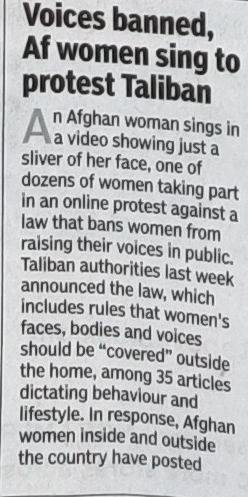

Text from box 12:
Voices banned,
Af women Sing to
protest Taliban
A Afghan woman Sings in
a video showing just a
sliver of her face, one of
dozens of women taking part
in an online protest against a
law that bans women, from
raising their voices jn Public,
Taliban authorities last week
announced the law, which
Includes rules that Women's
faces, bodies and Voices
should be “covereq” Outside
the home, among 35 articles
dictating behaviour and
lifestyle. In response, Afghan
ane inside and outside
the country have posteq



In [5]:
from ultralytics import YOLO
import cv2
import os
import pytesseract
from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Load the YOLO model
model = YOLO('/content/best_30_epochs.pt')

# Create a directory to save cropped images
output_dir = "/content/cropped_boxes"
os.makedirs(output_dir, exist_ok=True)

# Perform inference on an image
input_image_path = '/content/IMG_20240904_171353626.jpg'
results = model(input_image_path)

# Get the original image for cropping
original_image = cv2.imread(input_image_path)

# Loop over the detected objects
for i, box in enumerate(results[0].boxes.xyxy):
    x1, y1, x2, y2 = map(int, box)
    confidence = results[0].boxes.conf[i]  # Get confidence score
    class_id = results[0].boxes.cls[i]  # Get class ID

    if confidence > 0.1:  # Threshold for confidence
        # Crop the image using the bounding box coordinates
        cropped_img = original_image[y1:y2, x1:x2]

        # Save the cropped image
        output_path = os.path.join(output_dir, f"box_{i}.jpg")
        cv2.imwrite(output_path, cropped_img)

        # Perform OCR on the cropped image
        text = pytesseract.image_to_string(cropped_img)

        # Clean up the extracted text
        cleaned_text = "\n".join(line.strip().replace(":", "") for line in text.splitlines() if line.strip())

        # Display the cropped image and cleaned extracted text
        cv2_imshow(cropped_img)
        print(f"Text from box {i}:")
        print(cleaned_text)
        print()  # Print a newline for better readability
